# Supervised Regression with Multiple Variables
<hr>

## 0. Import library
<ht>

In [12]:
# Import libraries

# math library
import numpy as np

# visualization library
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png2x','pdf')
import matplotlib.pyplot as plt

# machine learning library
from sklearn.linear_model import LinearRegression

# 3d visualization
from mpl_toolkits.mplot3d import axes3d

# computational time
import time

## 1. Load dataset
<hr>

Load a set of data points $\{ (x_i, y_i, z_i) \}_{i=1}^n$ where $x_i$ and $y_i$ are considered as an input and $z_i$ is considered as an output for $i$-th data point.

In [13]:
# import data with numpy
data_clean = np.genfromtxt('data_clean.txt', delimiter=',')
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_clean = data_clean[:,0:3]  # do not change it
data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_clean = len(data_clean)
n_noisy = len(data_noisy)

## 2. Explore the dataset distribution
<hr>

Plot the training data points in 3D cartesian coordinate system.
(You may use matplotlib function `scatter3D()`.)

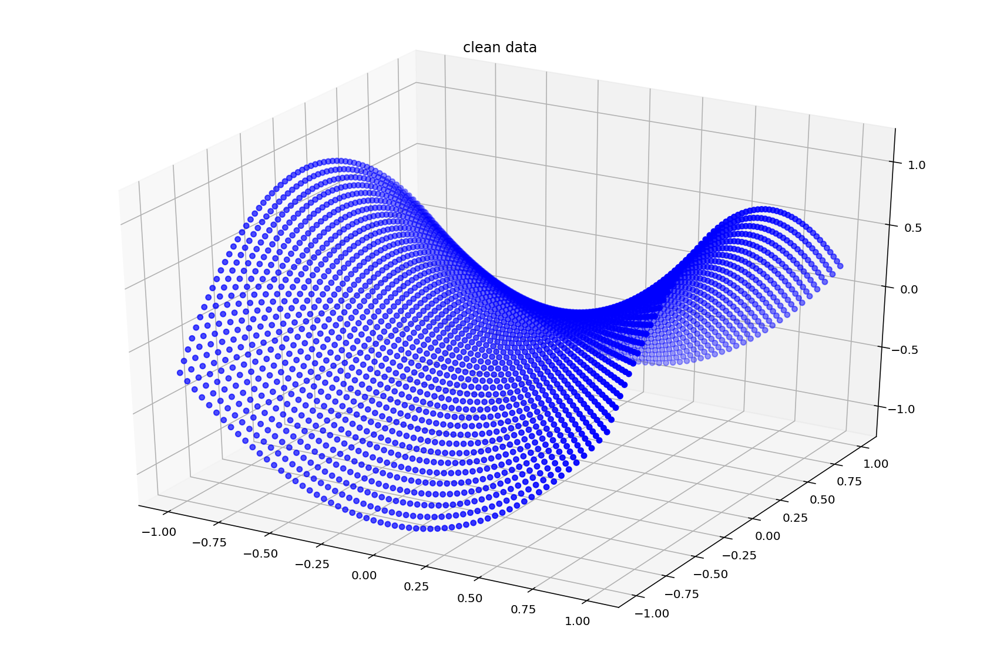

In [14]:
x_clean = data_clean[:,0]
y_clean = data_clean[:,1]
z_clean = data_clean[:,2]
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(projection='3d')
ax1.set_title('clean data')
ax1.scatter3D(x_clean, y_clean, z_clean, c='b')

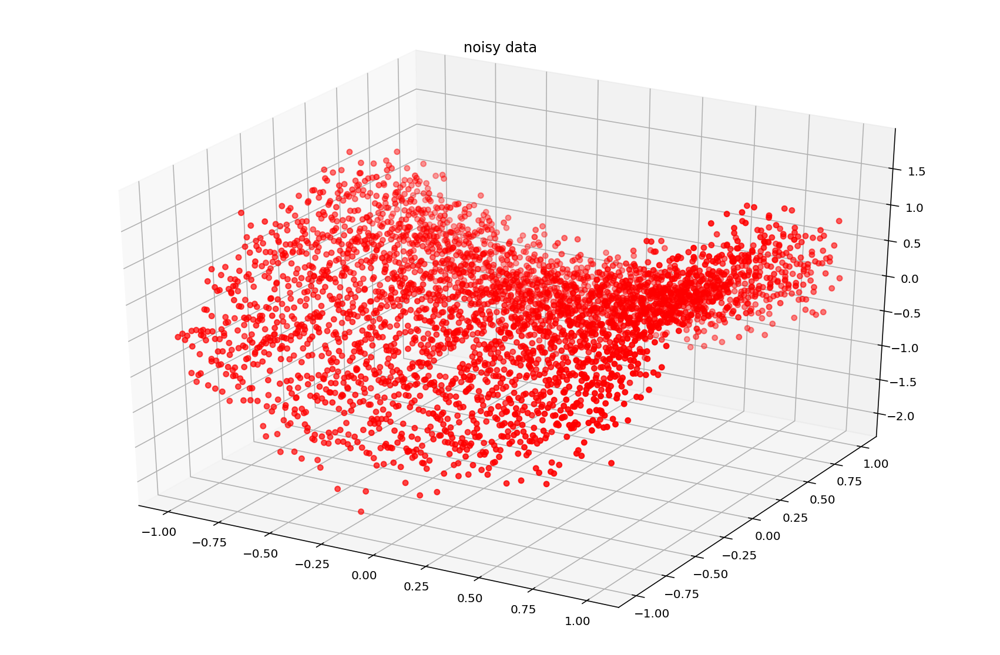

In [15]:
x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]
fig = plt.figure(figsize=(15,10))
ax2 = fig.add_subplot(projection='3d')
ax2.set_title('noisy data')
ax2.scatter3D(x_train, y_train, z_train, c='r')

## 3. Define the prediction function 
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

where feature function $f$ is defined as follows:

$$
\begin{align*}
    f_0(x, y) &= \\
    f_1(x, y) &= \\
    f_2(x, y) &= \\
    f_3(x, y) &= \\
    f_4(x, y) &= \\
    f_5(x, y) &= \\
    f_6(x, y) &= \\
    f_7(x, y) &= \\
    f_8(x, y) &= \\
    f_9(x, y) &= 
\end{align*}
$$

### Vectorized implementation:

$$
f_w(x) = X w 
$$
with 
<br>
$$
X = 
\left[ 
\begin{array}{cccc}
f_0(x_1, y_1) & f_1(x_1, y_1) & f_2(x_1, y_1) & f_3(x_1, y_1) & f_4(x_1, y_1) & f_5(x_1, y_1) & f_6(x_1, y_1) & f_7(x_1, y_1) & f_8(x_1, y_1) & f_9(x_1, y_1) \\
f_0(x_2, y_2) & f_1(x_2, y_2) & f_2(x_2, y_2) & f_3(x_2, y_2) & f_4(x_2, y_2) & f_5(x_2, y_2) & f_6(x_2, y_2) & f_7(x_2, y_2) & f_8(x_2, y_2) & f_9(x_2, y_2) \\
\vdots\\
f_0(x_n, y_n) & f_1(x_n, y_n) & f_2(x_n, y_n) & f_3(x_n, y_n) & f_4(x_n, y_n) & f_5(x_n, y_n) & f_6(x_n, y_n) & f_7(x_n, y_n) & f_8(x_n, y_n) & f_9(x_n, y_n)
\end{array} 
\right]
\quad
\textrm{ and }
\quad
w = 
\left[ 
\begin{array}{cccc}
w_0 \\ 
w_1 \\
w_2 \\ 
w_3 \\ 
w_4 \\ 
w_5 \\
w_6 \\
w_7 \\
w_8 \\
w_9
\end{array} 
\right]
$$

Implement the vectorized version of the predictive function. <br>

In [32]:
# construct data matrix

n = data_noisy.shape[0]
X = np.ones([n,10]) 

X[:,1] = data_noisy[:,0]
X[:,2] = data_noisy[:,1]
X[:,3] = 0
X[:,4] = 0
X[:,5] = 0
X[:,6] = 0
X[:,7] = 0
X[:,8] = 0
X[:,9] = 0

print(X.shape)

# parameters vector
w = np.array([1,1,1,1,1,1,1,1,1,1])[:,None] # [:,None] adds a singleton dimension
# predictive function definition
def f_pred(X,w): 
    
    f = np.matmul(X,w)
    
    return f 

# Test predicitive function 
z_pred = f_pred(X,w)

(3600, 10)


## 4. Define the regression loss 
<hr>
$$
L(w)=\frac{1}{n} \sum_{i=1}^n \ \Big( f_w(x_i, y_i) – z_i \Big)^2
$$

### Vectorized implementation:

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$
with 
<br>
$$
Xw=
\left[ 
\begin{array}{cccc}
f_w(x_1, y_1) \\ 
f_w(x_2, y_2) \\ 
\vdots\\
f_w(x_n, y_n) \\ 
\end{array} 
\right]
\quad
\textrm{ and }
\quad
z = 
\left[ 
\begin{array}{cccc}
z_1 \\ 
z_2 \\ 
\vdots\\
z_n
\end{array} 
\right]
$$

Implement the vectorized version of the regression loss function. <br>


In [58]:
# loss function definition
def loss_mse(z_pred,z): 
    loss = np.mean(np.power(z_pred-z,2))
    
    return loss


# Test loss function 
z = data_noisy[:,2][:,None]# label
z_pred = f_pred(X,w)# prediction
loss = loss_mse(z_pred,z)
loss

0.27127689482278144

## 5. Define the gradient of the regression loss 
<hr>

$\bullet$ Vectorized implementation: Given the loss

$$
L(w)=\frac{1}{n} (Xw-z)^T(Xw-z)
$$

The gradient is given by  

$$
\frac{\partial}{\partial w} L(w) = \frac{2}{n} X^T(Xw-z)
$$


Implement the vectorized version of the gradient of the regression loss function.

## 6. Implement the gradient descent algorithm 
<hr>

### Vectorized implementation: 

$$
w^{k+1} = w^{k} - \tau  \frac{2}{n} X^T(Xw^{k}-z)
$$

Implement the vectorized version of the gradient descent function.

Plot the loss values $L(w^k)$ with respect to iteration $k$ the number of iterations.

## 7. Plot the prediction function
<hr>
$$
f_w(x, y) = w_0 f_0(x, y) + w_1 f_1(x, y) + w_2 f_2(x, y) + w_3 f_3(x, y) + w_4 f_4(x, y) + w_5 f_5(x, y) + w_6 f_6(x, y) + w_7 f_7(x, y) + w_8 f_8(x, y) + w_9 f_9(x, y)
$$

(You may use numpy function `meshgrid` and `plot_surface` for plot the linear prediction function.)

In [37]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = 

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')

SyntaxError: invalid syntax (<ipython-input-37-8fa0de34aed3>, line 5)

## 8. Plot the prediction function superimposed on the training data
<hr>

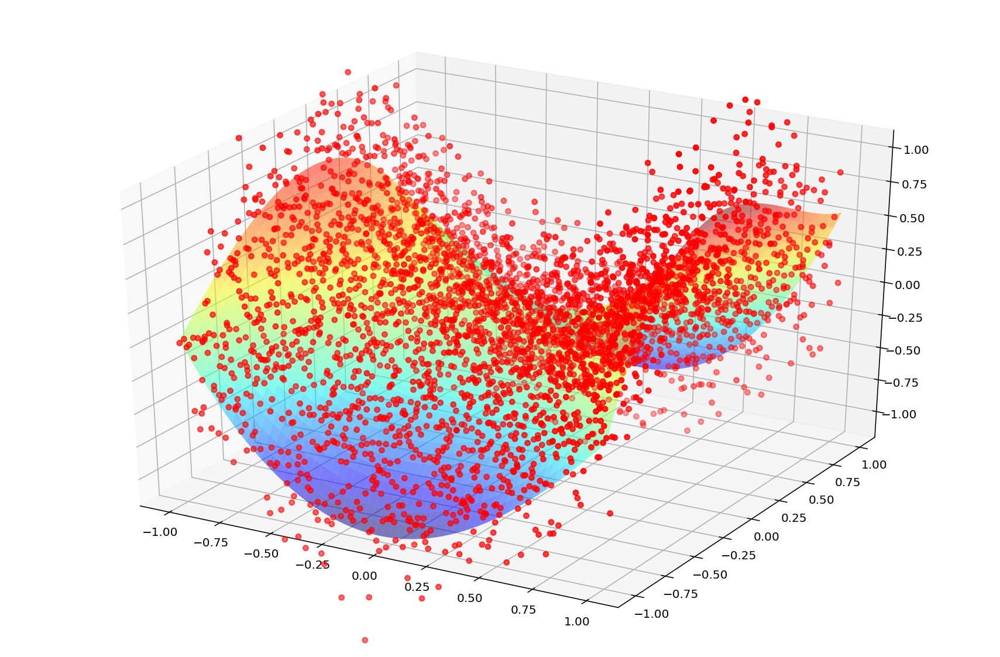

In [81]:
x_coordinate = np.linspace(-1, 1, 60) 
y_coordinate = np.linspace(-1, 1, 60) 

x_pred, y_pred = np.meshgrid(x_coordinate, y_coordinate, indexing='xy')
z_pred = 

# plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(1, 1, 1, projection='3d')

# Output results

## 1. Plot the clean data in 3D cartesian coordinate system (1pt)

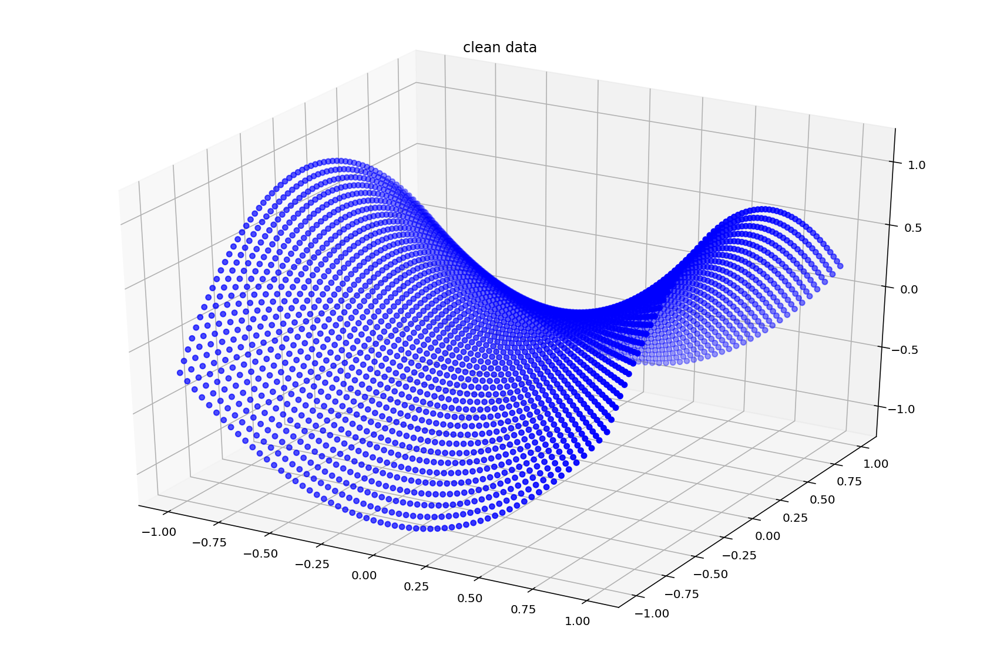

In [2]:
# import data with numpy
data_clean = np.genfromtxt('data_clean.txt', delimiter=',')
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_clean = data_clean[:,0:3]  # do not change it
data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_clean = len(data_clean)
n_noisy = len(data_noisy)
x_clean = data_clean[:,0]
y_clean = data_clean[:,1]
z_clean = data_clean[:,2]
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(projection='3d')
ax.set_title('clean data')
ax.scatter3D(x_clean, y_clean, z_clean,c ='b')

## 2. Plot the noisy data in 3D cartesian coordinate system (1pt)

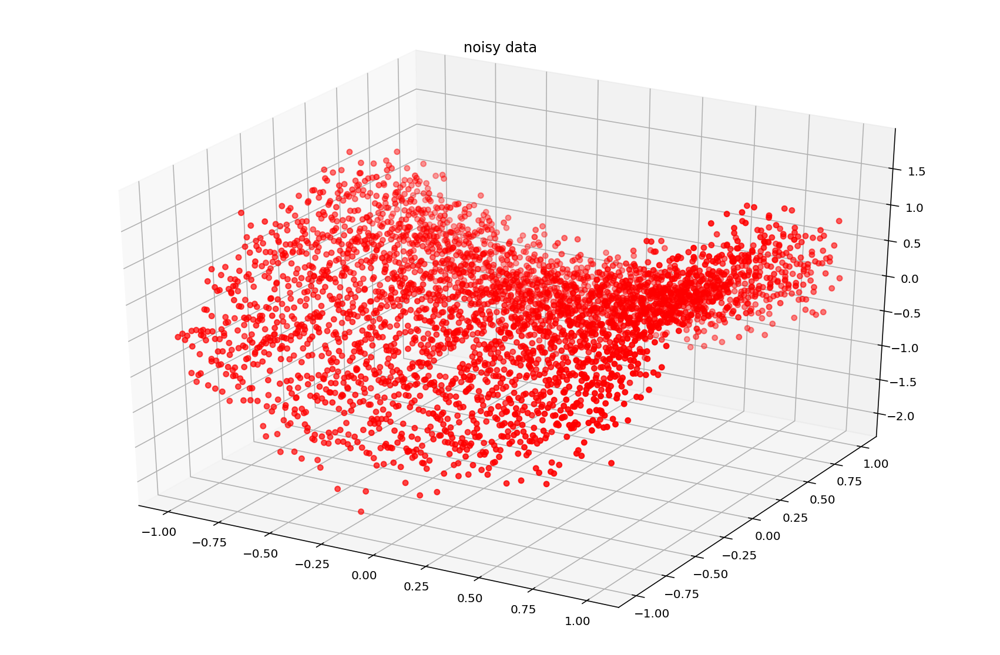

In [3]:
# import data with numpy
data_noisy = np.genfromtxt('data_noisy.txt', delimiter=',')

data_noisy = data_noisy[:,0:3]  # do not change it

# number of training data
n_noisy = len(data_noisy)
x_train = data_noisy[:,0]
y_train = data_noisy[:,1]
z_train = data_noisy[:,2]
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(projection='3d')
ax.set_title('noisy data')
ax.scatter3D(x_train, y_train, z_train, c='r')

## 3. Plot the loss curve in the course of gradient descent (2pt)

## 4. Print out the final loss value at convergence of the gradient descent (1pt)

## 5. Print out the final model parameter values at convergence of the gradient descent (1pt)

## 6. Plot the prediction function in 3D cartesian coordinate system (2pt)

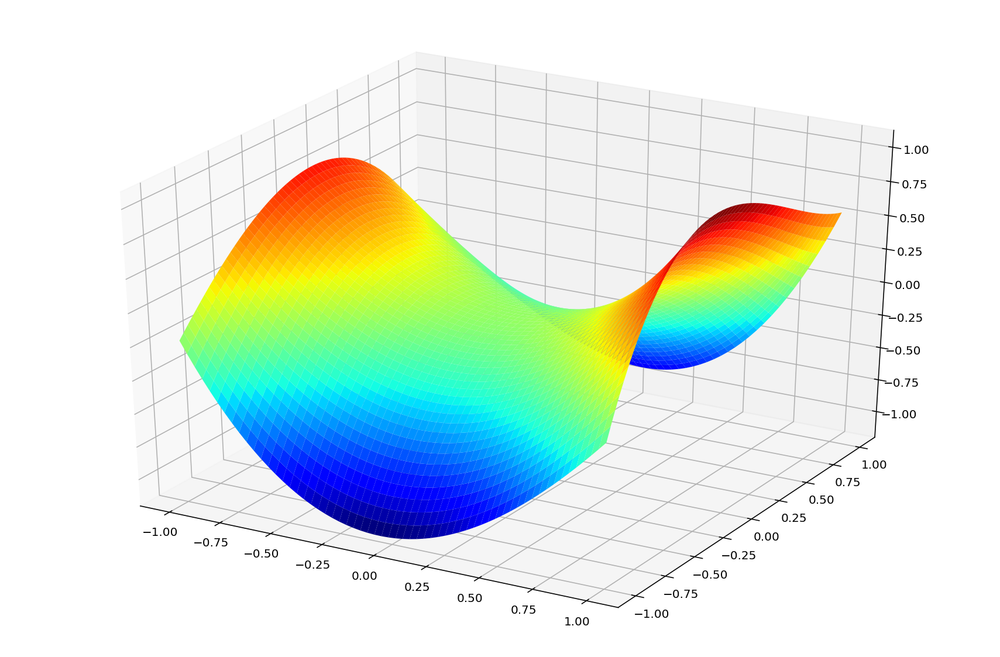

## 7. Plot the prediction functions superimposed on the training data (2pt)

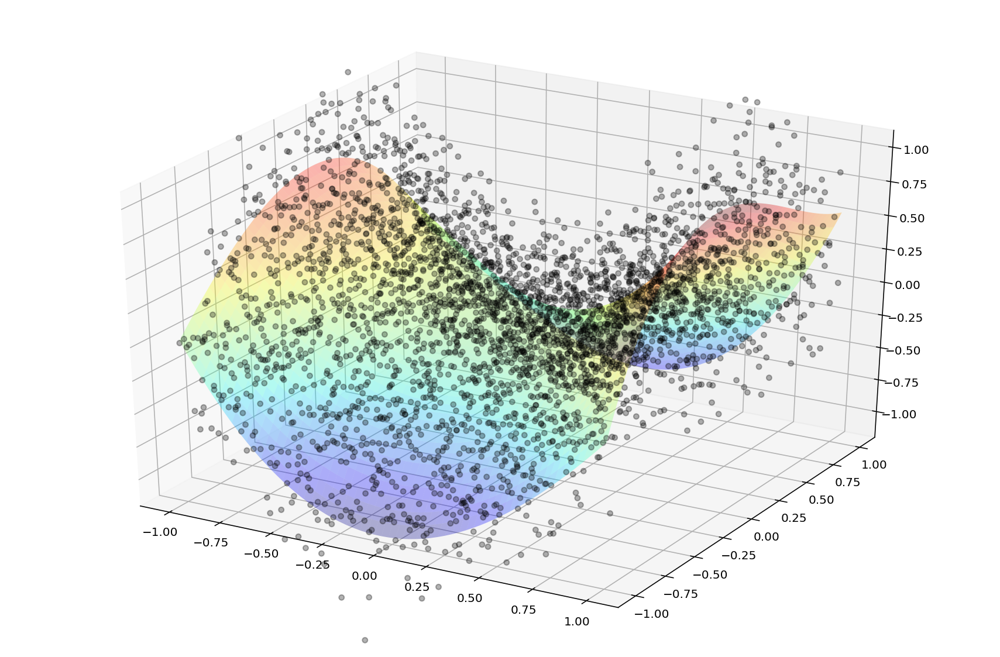